In [1]:
from time import time
import os
import itertools
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import jax
import jax.numpy as jnp
from src.spectral_xpci.xscatter import get_delta_beta_mix, get_wavenum
from src.spectral_xpci.simulate import get_wavelen, apply_psf, simulate_projection
from chromatix.ops import init_plane_resample
import chromatix.functional as cx
from Spectral_PBI_material_basis import spbi_material_basis

from skimage.data import shepp_logan_phantom  
from skimage.transform import resize 

from skimage.metrics import structural_similarity


In [2]:
plt.rcParams.update({
    'figure.dpi': 150,
    'font.size':10,
    'axes.titlesize':10,
    'axes.labelsize':8,
    'axes.linewidth': .5,
    'xtick.top': True, 
    'ytick.right': True, 
    'xtick.direction': 'in', 
    'ytick.direction': 'in',
    'xtick.labelsize':8,
    'ytick.labelsize':8,
    'legend.fontsize': 8,
    'lines.linewidth':1,
    'image.cmap':'gray',
    })

def add_scalebar(ax, sz, Nx, real_dx, real_units, color='k'):
    width_px = sz * Nx 
    label = f'{real_dx * width_px:.0f} {real_units}'
    scalebar = AnchoredSizeBar(ax.transData, width_px, label, 'lower left', size_vertical=1, frameon=False, color=color)
    ax.add_artist(scalebar)

class Material:
    def __init__(self, name, matcomp, density):
        self.name = name
        self.matcomp = matcomp
        self.density = density
    def delta_beta(self, energy, density=None):
        if density is None:
            density = self.density
        delta, beta = get_delta_beta_mix(self.matcomp, np.atleast_1d(energy), density)
        return delta.squeeze(), beta.squeeze()
tissue = Material('tissue', 'H(10.2)C(14.3)N(3.4)O(70.8)Na(0.2)P(0.3)S(0.3)Cl(0.2)K(0.3)', 1.4226315789473687)   # rescaled 1.06 g/cm3 for dense tissue area!
bone = Material('bone', 'H(3.4)C(15.5)N(4.2)O(43.5)Na(0.1)Mg(0.2)P(10.3)S(0.3)Ca(22.5)', 1.92)

def get_ssim(im1, im2, dr=2, nanval=-1):
    ssim = structural_similarity(im1, im2, data_range=dr)
    if np.isnan(ssim):
        ssim = nanval
    return ssim
    
def get_rmse(im1, im2, nanval=2):
    rmse = np.sqrt(np.mean((im1-im2)**2))
    if np.isnan(rmse):
        rmse = nanval
    return rmse

def get_metrics(vol1, vol2):
    metrics = []
    for i in range(2):
        rmse = get_rmse(vol1[i], vol2[i])
        ssim = get_ssim(vol1[i], vol2[i])
        metrics.append([rmse, ssim])
    return np.array(metrics)


In [3]:
def shepp_logan_2mat(N, mat1, mat2, dtype=np.float32):
    vol_raw = shepp_logan_phantom()
    vals = sorted(np.unique(vol_raw))
    vol = np.zeros((2,)+vol_raw.shape)
    for val in vals[1:-1]:
        scaled_density = (val/vals[-2]) * mat1.density
        vol[0][np.where(vol_raw == val)] = scaled_density
    vol[1][np.where(vol_raw == vals[-1])] = mat2.density
    return resize(vol, (2, N, N)).astype(dtype)

def mats_to_dbproj(vol, energy, mat1, mat2, t1, t2, dtype=np.float32):
    d1, b1 = mat1.delta_beta(energy, 1)
    d2, b2 = mat2.delta_beta(energy, 1)
    dproj = d1*t1*vol[0] + d2*t2*vol[1]
    bproj = b1*t1*vol[0] + b2*t2*vol[1]
    return dproj, bproj


In [4]:
outd = 'figs_aapm2025_matdecomp/output/'
os.makedirs(outd, exist_ok=True)

# Simulations

In [94]:
%%time

##########################################
### Parameters 

N_repeats = 1
noiselevels = np.array([3,4,5])
propdists = np.arange(0, 210, 10)*1e-3 
energies = np.arange(15, 36, 1)

# Phantom:
N = 4096 
dx = 0.5e-6 
mat1 = tissue
mat2 = bone
T1 = .5e-3
T2 = .1e-3
fov = N*dx  
phantom = shepp_logan_2mat(N, mat1, mat2)

# Detector:
det_N = 256
det_shape = (det_N, det_N)  
det_fov = fov                
det_dx = det_fov / det_N
det_psf = 'lorentzian'
det_fwhm = 10e-6
phantom_det = shepp_logan_2mat(det_N, mat1, mat2)
phantom_gt = np.array([phantom_det[0]/1.06, phantom_det[1]/1.92])

# Misc.
ds1, bs1 = mat1.delta_beta(energies, 1.06)
ds2, bs2 = mat2.delta_beta(energies, 1.92)
ds = -np.array([ds1, ds2])
mus = 2 * np.array([bs1, bs2]) * get_wavenum(np.stack([energies, energies]))

print(f'detector px = {det_dx*1e6:.1f} um, FOV = {fov*1e3:.2f} mm')


##########################################
### Simulate 

imgs = np.zeros((noiselevels.size, N_repeats, energies.size, propdists.size) + det_shape, dtype=np.float32)
t0 = time()
for n, noiselevel in enumerate(noiselevels):
    for rep in range(N_repeats):
        I0 = 10**noiselevel
        for i, energy in enumerate(energies):
            dproj, bproj = mats_to_dbproj(phantom, energy, mat1, mat2, T1, T2)
            for j, propdist in enumerate(propdists):
                fname = outd+f'img_{energy:.0f}keV_{propdist*1e3:.0f}mm_1e{noiselevel:.0f}_x{rep+1}.bin'
                if os.path.isfile(fname):
                    img = np.fromfile(fname, dtype=np.float32).reshape(det_shape)
                else:
                    img = simulate_projection(bproj, dproj, dx, N, det_shape, det_dx, det_fwhm, energy, propdist, I0, det_psf=det_psf) 
                    np.array(img).astype(np.float32).tofile(fname)
                imgs[n, rep, i, j] = img 
        print(f'1e{noiselevel} x {rep+1} - {time() - t0:.0f} s')


detector px = 8.0 um, FOV = 2.05 mm
1e3 x 1 - 2 s
1e4 x 1 - 11 s
1e5 x 1 - 13 s
CPU times: user 24.5 s, sys: 6.5 s, total: 31 s
Wall time: 14.3 s


# Material decomposition

In [95]:
%%time

clipmin = 0
clipmax = 2
clipval = clipmax-clipmin
kw = {'cmap':'bwr', 'vmin':0, 'vmax':clipval}


##########################################
### Material decomp 

i_vals = range(energies.size)
i_pairs = np.array(list(itertools.product(i_vals, i_vals)))

j_vals = range(propdists.size)
j_pairs = np.array(list(itertools.product(j_vals, j_vals)))

output_spectral_allnoise = []   
output_multidist_allnoise = [] 

t0 = time()
for n, noiselevel in enumerate(noiselevels):
    
    output_spectral = []  
    output_multidist = []  

    for rep in range(N_repeats):

        ### MULTI-ENERGY ###       
        for i1, i2 in i_pairs:
            t_energies = np.array([energies[i1], energies[i2]])
            if t_energies[0] - t_energies[1] >= 1e-10:
                ds1, bs1 = mat1.delta_beta(t_energies, 1.06)
                ds2, bs2 = mat2.delta_beta(t_energies, 1.92)
                ds = -np.array([ds1, ds2])
                mus = 2 * np.array([bs1, bs2]) * get_wavenum(np.stack([t_energies, t_energies]))
                for j in range(propdists.size):
                    t_imgs = [imgs[n,rep,i1,j], imgs[n,rep,i2,j]]
                    propdist = propdists[j]
                    TR1, TR2 = spbi_material_basis(t_imgs, propdist, det_dx, ds.T, mus.T)
                    im1 = (TR1 / T1).clip(clipmin, clipmax) - clipmin
                    im2 = (TR2 / T2).clip(clipmin, clipmax) - clipmin
                    t_out = {'E1': np.min(t_energies), 
                             'E2': np.max(t_energies),
                             'R': int(1e3*propdist),
                             'noise':noiselevel,
                             'im1': im1,
                             'im2': im2,
                             'ssim1': get_ssim(phantom_gt[0], im1, dr=clipval),
                             'ssim2': get_ssim(phantom_gt[1], im2, dr=clipval),
                             'rmse1': get_rmse(phantom_gt[0], im1),
                             'rmse2': get_rmse(phantom_gt[1], im2),
                             'rep': rep+1
                            }
                    t_out['ssim'] = (t_out['ssim1']+t_out['ssim2'])/2  # avg metrics for convenience
                    t_out['rmse'] = (t_out['rmse1']+t_out['rmse2'])/2
                    output_spectral.append(t_out)

        ### MULTI-DISTANCE ###
        for i in range(energies.size):
            energy = energies[i]
            ds1, bs1 = mat1.delta_beta(energy, 1.06)
            ds2, bs2 = mat2.delta_beta(energy, 1.92)
            ds = -np.array([ds1, ds2])
            mus = 2 * np.array([bs1, bs2]) * get_wavenum(energy)
            for j1, j2 in j_pairs:
                t_propdists = [propdists[j1], propdists[j2]]
                if t_propdists[0] - t_propdists[1] >= 1e-10:
                    t_imgs = [imgs[n,rep,i,j1], imgs[n,rep,i,j2]]
                    TR1, TR2 = spbi_material_basis(t_imgs, t_propdists, det_dx, ds.T, mus.T)
                    im1 = (TR1 / T1).clip(clipmin, clipmax) - clipmin
                    im2 = (TR2 / T2).clip(clipmin, clipmax) - clipmin
                    t_out = {'R1': int(1e3*np.min(t_propdists)),
                             'R2': int(1e3*np.max(t_propdists)),
                             'E': energy,
                             'im1': im1,
                             'im2': im2,
                             'ssim1': get_ssim(phantom_gt[0], im1, dr=clipval),
                             'ssim2': get_ssim(phantom_gt[1], im2, dr=clipval),
                             'rmse1': get_rmse(phantom_gt[0], im1),
                             'rmse2': get_rmse(phantom_gt[1], im2),
                             'rep': rep+1
                            }
                    t_out['ssim'] = (t_out['ssim1']+t_out['ssim2'])/2  # avg metrics for convenience
                    t_out['rmse'] = (t_out['rmse1']+t_out['rmse2'])/2
                    output_multidist.append(t_out)                        
                
        print(f'1e{noiselevel} x {rep+1} - {time() - t0:.0f} s')

    output_spectral_allnoise.append(output_spectral)
    output_multidist_allnoise.append(output_multidist)


/Users/gjad/Documents/Workspace/spectral-xpci/Spectral_PBI_material_basis.py:149: RuntimeWarning: divide by zero encountered in divide
  iDCAB = 1./(D - C * iA * B)


1e3 x 1 - 67 s
1e4 x 1 - 135 s
1e5 x 1 - 204 s
CPU times: user 3min 20s, sys: 3.41 s, total: 3min 23s
Wall time: 3min 24s


# Analysis


####################################################################################
####################################################################################
### Noise level ~ 1e3 


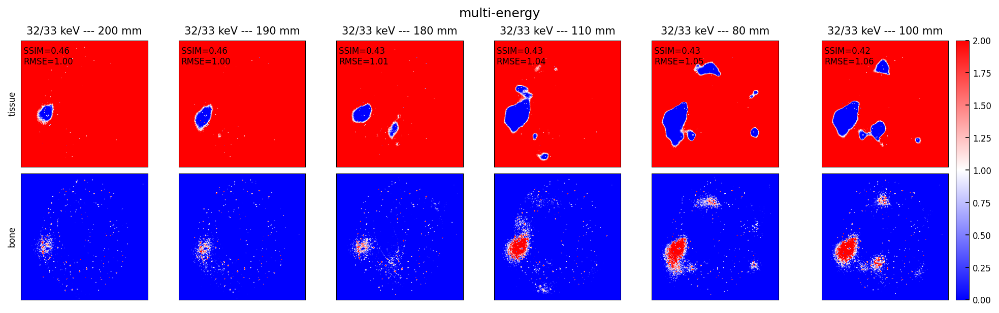

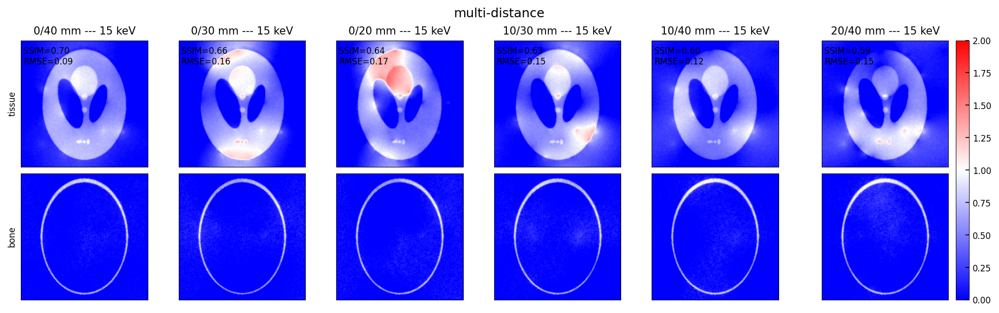


####################################################################################
####################################################################################
### Noise level ~ 1e5 


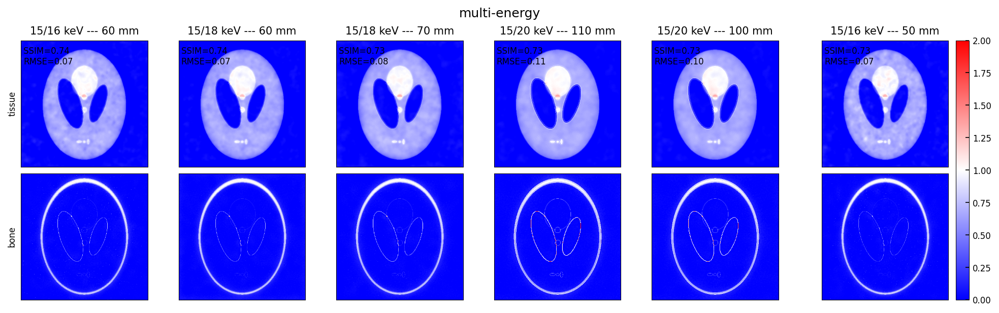

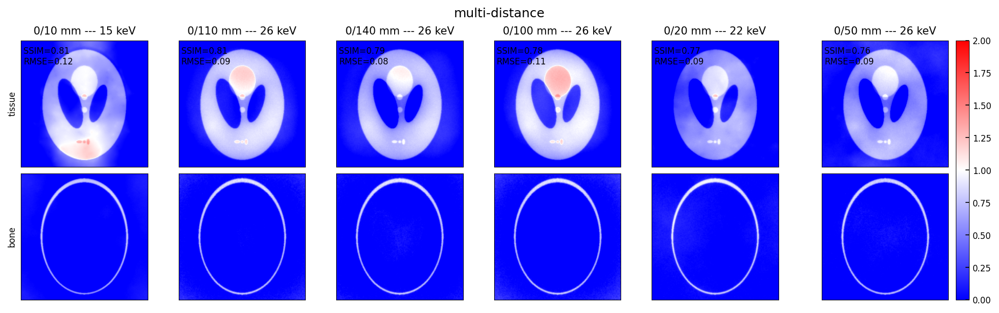

In [23]:
Ntop = 6
sz = 2
def add_text(axi, text):
    axi.annotate(text, xy=(0.02, 0.95), xycoords='axes fraction', fontsize=8, ha='left', va='top', color='k')
kw = {'cmap':'bwr', 'vmin':0, 'vmax':clipval}

for n, noiselevel in enumerate(noiselevels):
    print(f'\n####################################################################################')
    print(f'####################################################################################')
    print(f'### Noise level ~ 1e{noiselevel} ')

    output_spectral = output_spectral_allnoise[n]
    output_multidist = output_multidist_allnoise[n]
    specsort = sorted(output_spectral, key=lambda x: x['ssim'])[::-1]
    distsort = sorted(output_multidist, key=lambda x: x['ssim'])[::-1]

    ### MULTI-ENERGY ###
    fig, ax = plt.subplots(2, Ntop, figsize=[sz*Ntop+1, sz*2], layout='constrained')
    fig.suptitle('multi-energy')
    ax[0,0].set_ylabel(mat1.name)
    ax[1,0].set_ylabel(mat2.name)
    for k, data in enumerate(specsort[:Ntop]):
        m = ax[0,k].imshow(data['im1'], **kw)
        m = ax[1,k].imshow(data['im2'], **kw)
        ax[0,k].set_title(f"{data['E1']}/{data['E2']} keV --- {data['R']} mm")# (x{data['rep']})")
        add_text(ax[0,k], f"SSIM={data['ssim']:.2f} \nRMSE={data['rmse']:.2f}")
    for axi in ax.ravel():
        axi.set_xticks([])
        axi.set_yticks([])
    fig.colorbar(m, ax=ax[:,-1])
    plt.show()

    ### MULTI-DISTANCE ###
    fig, ax = plt.subplots(2, Ntop, figsize=[sz*Ntop+1, sz*2], layout='constrained')
    fig.suptitle('multi-distance')
    ax[0,0].set_ylabel(mat1.name)
    ax[1,0].set_ylabel(mat2.name)
    for k, data in enumerate(distsort[:Ntop]):
        m = ax[0,k].imshow(data['im1'], **kw)
        m = ax[1,k].imshow(data['im2'], **kw)
        ax[0,k].set_title(f"{data['R1']}/{data['R2']} mm --- {data['E']} keV")# (x{data['rep']})")
        add_text(ax[0,k], f"SSIM={data['ssim']:.2f} \nRMSE={data['rmse']:.2f}")
    for axi in ax.ravel():
        axi.set_xticks([])
        axi.set_yticks([])
    fig.colorbar(m, ax=ax[:,-1])
    plt.show()


####################################################################################
####################################################################################
### Noise level ~ 1e3 


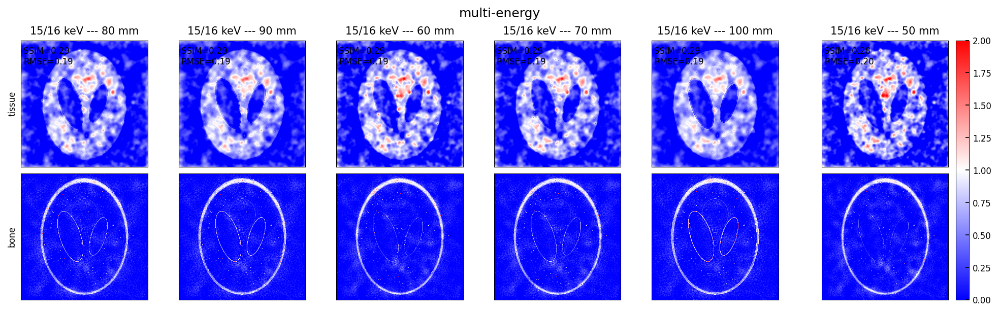

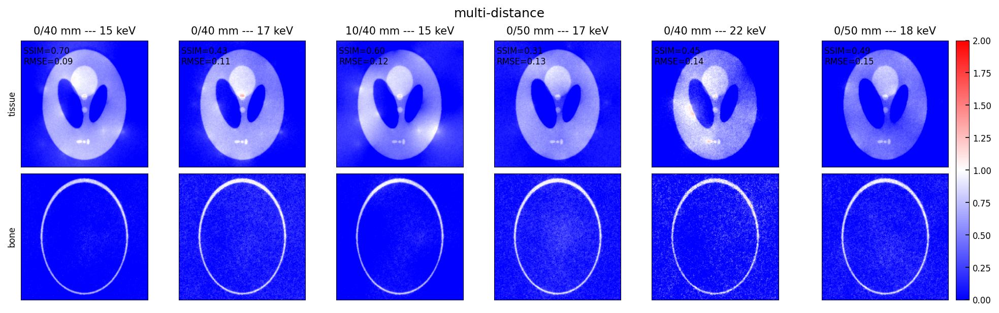


####################################################################################
####################################################################################
### Noise level ~ 1e5 


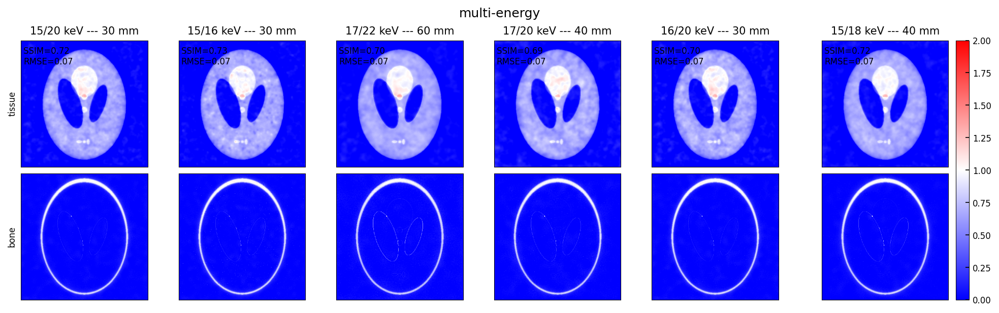

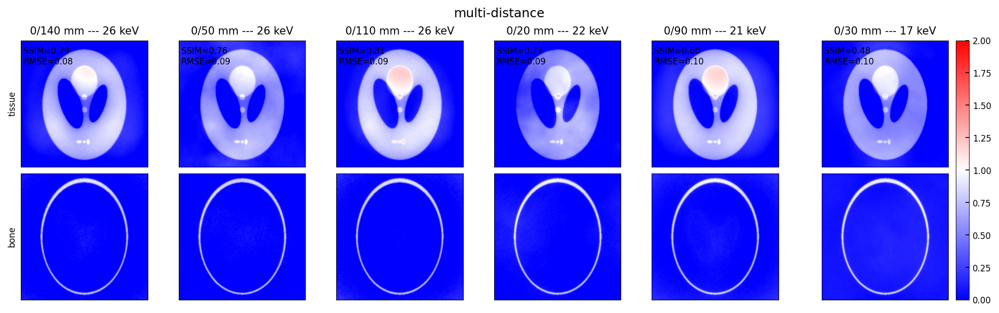

In [24]:
Ntop = 6
sz = 2
def add_text(axi, text):
    axi.annotate(text, xy=(0.02, 0.95), xycoords='axes fraction', fontsize=8, ha='left', va='top', color='k')
    
for n, noiselevel in enumerate(noiselevels):
    print(f'\n####################################################################################')
    print(f'####################################################################################')
    print(f'### Noise level ~ 1e{noiselevel} ')

    output_spectral = output_spectral_allnoise[n]
    output_multidist = output_multidist_allnoise[n]
    specsort = sorted(output_spectral, key=lambda x: x['rmse'])
    distsort = sorted(output_multidist, key=lambda x: x['rmse'])

    ### MULTI-ENERGY ###
    fig, ax = plt.subplots(2, Ntop, figsize=[sz*Ntop+1, sz*2], layout='constrained')
    fig.suptitle('multi-energy')
    ax[0,0].set_ylabel(mat1.name)
    ax[1,0].set_ylabel(mat2.name)
    for k, data in enumerate(specsort[:Ntop]):
        m = ax[0,k].imshow(data['im1'], **kw)
        m = ax[1,k].imshow(data['im2'], **kw)
        ax[0,k].set_title(f"{data['E1']}/{data['E2']} keV --- {data['R']} mm")# (x{data['rep']})")
        add_text(ax[0,k], f"SSIM={data['ssim']:.2f} \nRMSE={data['rmse']:.2f}")
    for axi in ax.ravel():
        axi.set_xticks([])
        axi.set_yticks([])
    fig.colorbar(m, ax=ax[:,-1])
    plt.show()

    ### MULTI-DISTANCE ###
    fig, ax = plt.subplots(2, Ntop, figsize=[sz*Ntop+1, sz*2], layout='constrained')
    fig.suptitle('multi-distance')
    ax[0,0].set_ylabel(mat1.name)
    ax[1,0].set_ylabel(mat2.name)
    for k, data in enumerate(distsort[:Ntop]):
        m = ax[0,k].imshow(data['im1'], **kw)
        m = ax[1,k].imshow(data['im2'], **kw)
        ax[0,k].set_title(f"{data['R1']}/{data['R2']} mm --- {data['E']} keV")# (x{data['rep']})")
        add_text(ax[0,k], f"SSIM={data['ssim']:.2f} \nRMSE={data['rmse']:.2f}")
    for axi in ax.ravel():
        axi.set_xticks([])
        axi.set_yticks([])
    fig.colorbar(m, ax=ax[:,-1])
    plt.show()

# Figures

In [26]:
figd = 'figs_aapm2025_matdecomp/'

## Ground truth phantom

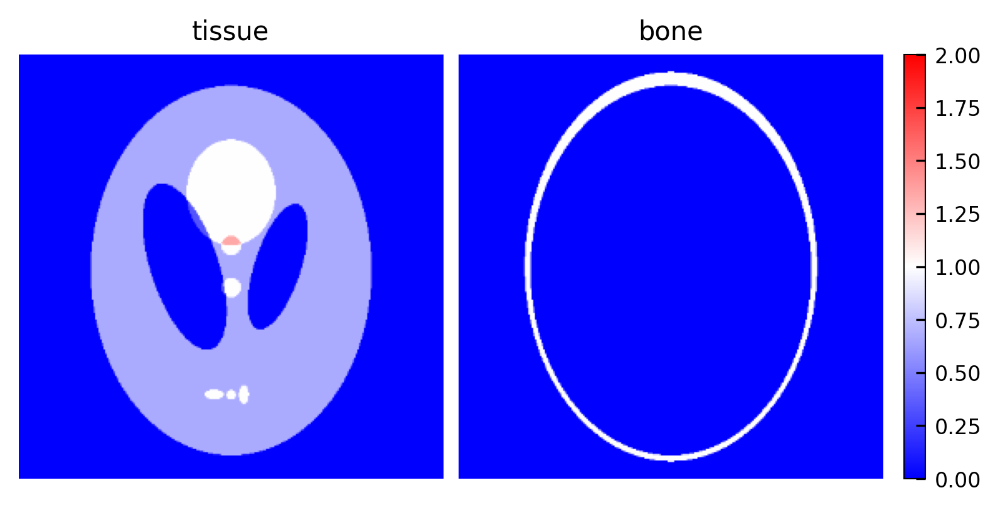

In [124]:
kw = {'cmap':'bwr', 'vmin':0, 'vmax':clipval}

fig, ax = plt.subplots(1, 2, figsize=[5.2, 2.6], layout='constrained', dpi=300)
m = ax[0].imshow(phantom_gt[0], **kw)
m = ax[1].imshow(phantom_gt[1], **kw)
ax[0].set_title(mat1.name)
ax[1].set_title(mat2.name)
for axi in ax:
    axi.axis('off')
fig.colorbar(m, ax=ax[-1])
plt.savefig(figd+'phantom.png')
plt.show()


## Example raw images

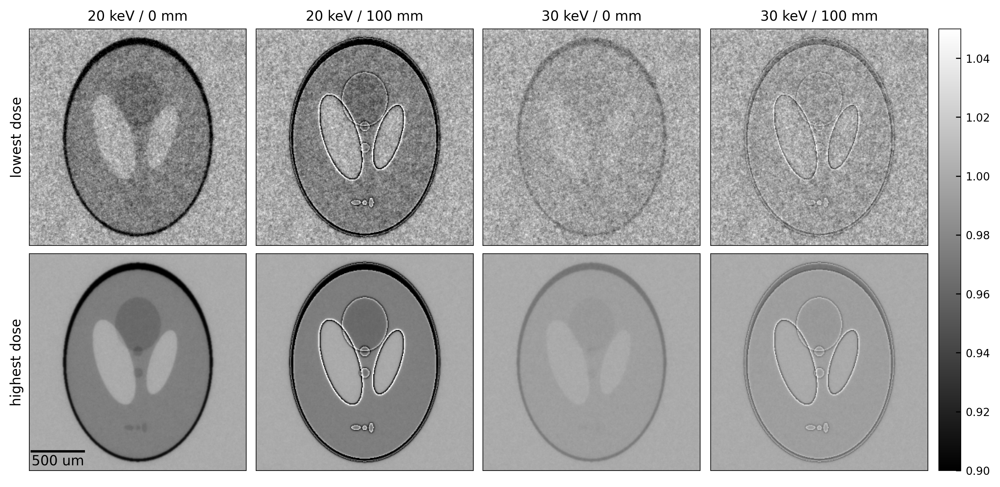

In [123]:
# n = 0            # one noise level
rep = 0          # one repeat
i_ex = [5, 15]   # 20, 30 keV 
j_ex = [0, 10]   # 0, 150 mm
kw = {'cmap':'gray', 'vmin':0.9, 'vmax':1.05}
N_plots = len(i_ex)*len(j_ex)
sz = 2.5

fig, ax = plt.subplots(2, N_plots, figsize=[N_plots*sz, 1.93*sz], layout='constrained', dpi=300)
# manual!!
ax[0,0].set_ylabel('lowest dose', fontsize=10)
ax[1,0].set_ylabel('highest dose', fontsize=10)
for n in [0,-1]:
    for i, ii in enumerate(i_ex):
        for j, jj in enumerate(j_ex):
            axi = ax[n, j+2*i]  
            m = axi.imshow(imgs[n, rep, ii, jj], **kw)
            axi.set_xticks([])
            axi.set_yticks([])
            if n==0:
                axi.set_title(f'{energies[ii]} keV / {propdists[jj]*1e3:.0f} mm')

add_scalebar(ax[1,0], sz=0.244, Nx=det_shape[0], real_dx=1e6*det_dx, real_units='um', color='k')#, Nx, real_dx, real_units, color='k')
fig.colorbar(m, ax=ax[:,-1], shrink=1)
plt.savefig(figd+'imgs.png')
plt.show()




## Best material decompositions


####################################################################################
####################################################################################
### Noise level ~ 1e3 


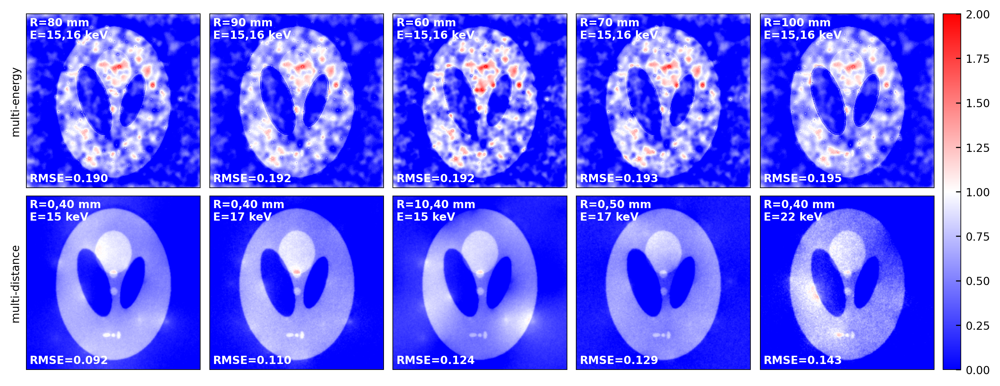


####################################################################################
####################################################################################
### Noise level ~ 1e4 


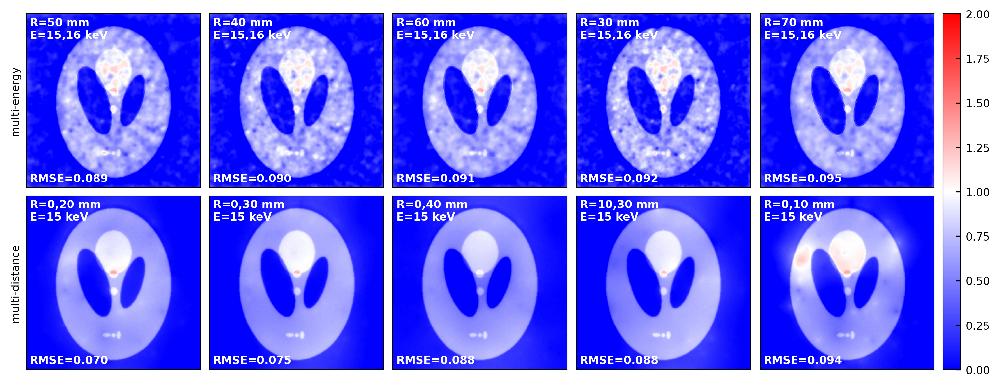


####################################################################################
####################################################################################
### Noise level ~ 1e5 


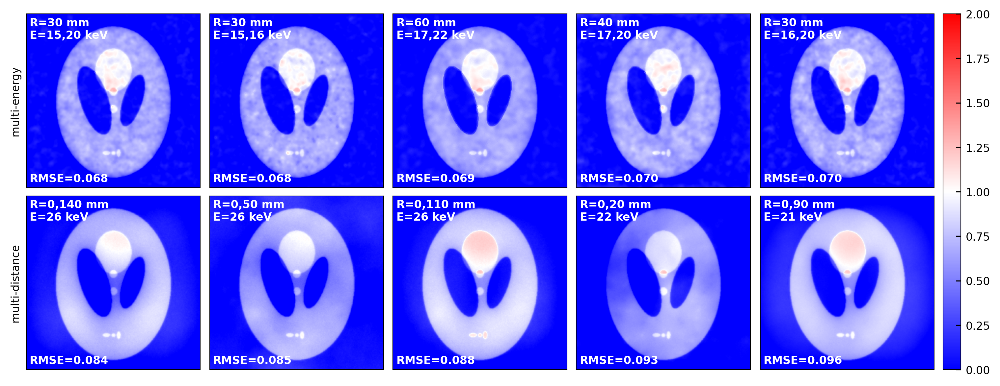

In [168]:
Ntop = 5
sz = 2
def add_text(axi, text):
    axi.annotate(text, xy=(0.02, 0.98), xycoords='axes fraction', fontsize=8, ha='left', va='top', color='w', fontweight='bold')

def add_text2(axi, text):
    axi.annotate(text, xy=(0.02, 0.02), xycoords='axes fraction', fontsize=8, ha='left', va='bottom', color='w', fontweight='bold')
    
for n, noiselevel in enumerate(noiselevels):
    print(f'\n####################################################################################')
    print(f'####################################################################################')
    print(f'### Noise level ~ 1e{noiselevel} ')

    specsort = sorted(output_spectral_allnoise[n], key=lambda x: x['rmse'])
    distsort = sorted(output_multidist_allnoise[n], key=lambda x: x['rmse'])

    ### MULTI-ENERGY ###
    fig, ax = plt.subplots(2, Ntop, figsize=[sz*Ntop, sz*1.9], layout='constrained', dpi=300)
    ax[0,0].set_ylabel('multi-energy')
    ax[1,0].set_ylabel('multi-distance')
    for k, data in enumerate(specsort[:Ntop]):
        m = ax[0,k].imshow(data['im1'], **kw)
        add_text(ax[0,k], f"R={data['R']} mm\nE={data['E1']},{data['E2']} keV")
        add_text2(ax[0,k], f"RMSE={data['rmse']:.3f}")

    for k, data in enumerate(distsort[:Ntop]):
        m = ax[1,k].imshow(data['im1'], **kw)
        add_text(ax[1,k], f"R={data['R1']},{data['R2']} mm\nE={data['E']} keV")
        add_text2(ax[1,k], f"RMSE={data['rmse']:.3f}")
    for axi in ax.ravel():
        axi.set_xticks([])
        axi.set_yticks([])
        
    fig.colorbar(m, ax=ax[:,-1], shrink=1)
    plt.savefig(figd+f'matdecomp_rmse_1e{noiselevel}.png')
    plt.show()

## Sorted SSIM/RMSE

4410

10^3 fail rate = 42.9%
 multi-E:    ssim = 0.461, rmse = 0.190
 multi-dist: ssim = 0.701, rmse = 0.092

10^4 fail rate = 42.9%
 multi-E:    ssim = 0.568, rmse = 0.089
 multi-dist: ssim = 0.858, rmse = 0.070

10^5 fail rate = 42.9%
 multi-E:    ssim = 0.739, rmse = 0.068
 multi-dist: ssim = 0.807, rmse = 0.084


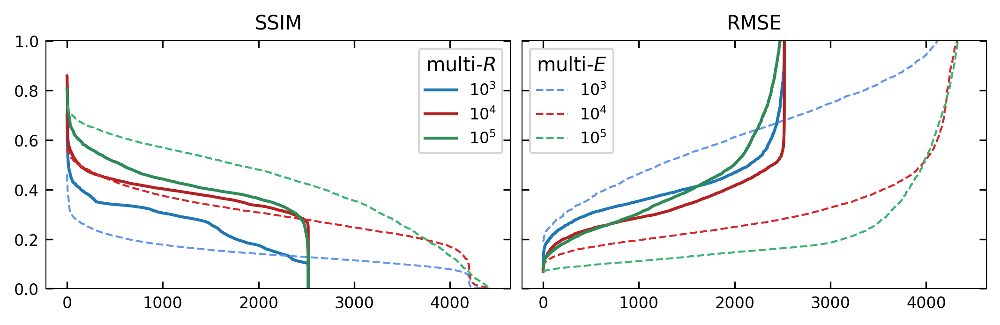

In [136]:
colors = ['tab:blue', 'firebrick', 'seagreen']
colors2 = ['cornflowerblue', 'tab:red', 'mediumseagreen']
# xvals = np.linspace(0, 100, len(output_multidist_allnoise[n]))
xvals = np.arange(0, len(output_multidist_allnoise[n]))
print( len(output_multidist_allnoise[n]))

fig, ax = plt.subplots(1, 2, figsize=[7,2.2], layout='constrained', sharey=True, dpi=300)
for n, noiselevel in enumerate(noiselevels):
    snoise = f'$10^{noiselevel}$'
    fails = 0
    for val in [x['ssim'] for x in output_multidist_allnoise[n]]:
        if val < 0:
            fails += 1
    print(f'\n10^{noiselevel} fail rate = {100 * fails/len(output_multidist_allnoise[n]):.1f}%')
    print(f" multi-E:    ssim = {np.max([x['ssim'] for x in output_spectral_allnoise[n]]):.3f}, rmse = {np.min([x['rmse'] for x in output_spectral_allnoise[n]]):.3f}")
    print(f" multi-dist: ssim = {np.max([x['ssim'] for x in output_multidist_allnoise[n]]):.3f}, rmse = {np.min([x['rmse'] for x in output_multidist_allnoise[n]]):.3f}")
    
    ssim_multidist = sorted([x['ssim'] for x in output_multidist_allnoise[n]])[::-1]
    ssim_spectral = sorted([x['ssim'] for x in output_spectral_allnoise[n]])[::-1]
    
    rmse_multidist = sorted([x['rmse'] for x in output_multidist_allnoise[n]])
    rmse_spectral = sorted([x['rmse'] for x in output_spectral_allnoise[n]])

    ax[0].plot(xvals, ssim_multidist, label=snoise, lw=1.5, color=colors[n])
    ax[0].plot(xvals, ssim_spectral, '--', color=colors2[n])

    ax[1].plot(xvals, rmse_multidist, lw=1.5, color=colors[n])
    ax[1].plot(xvals, rmse_spectral, '--', label=snoise, color=colors2[n])

ax[0].set_ylim(0, 1)
ax[1].set_ylim(0, 1)
ax[0].legend(title='multi-$R$')
ax[1].legend(title='multi-$E$')
ax[0].set_title('SSIM')
ax[1].set_title('RMSE')

plt.savefig(figd+'metrics.png')
plt.show()

# Misc.

In [311]:
%%time


### multi-R
j_vals = range(propdists.size)
j_pairs = np.array(list(itertools.product(j_vals, j_vals)))

output_multidist = []   
for i, energy in enumerate(energies):
    ds1, bs1 = mat1.delta_beta(energy, 1.06)
    ds2, bs2 = mat2.delta_beta(energy, 1.92)
    ds = -np.array([ds1, ds2])
    mus = 2 * np.array([bs1, bs2]) * get_wavenum(energy)

    for j1, j2 in j_pairs:
        t_propdists = [propdists[j1], propdists[j2]]
        
        if t_propdists[0] - t_propdists[1] >= 1e-10:
            t_imgs = [imgs[i,j1], imgs[i,j2]]
            TR1, TR2 = spbi_material_basis(t_imgs, t_propdists, det_dx, ds.T, mus.T)
            im1 = (TR1 / T1).clip(clipmin, clipmax) - clipmin
            im2 = (TR2 / T2).clip(clipmin, clipmax) - clipmin
            t_out = {'R1': int(1e3*np.min(t_propdists)),
                     'R2': int(1e3*np.max(t_propdists)),
                     'E': energy,
                     'im1': im1,
                     'im2': im2,
                     'ssim1': get_ssim(phantom_gt[0], im1, dr=clipval),
                     'ssim2': get_ssim(phantom_gt[1], im2, dr=clipval),
                     'rmse1': get_rmse(phantom_gt[0], im1),
                     'rmse2': get_rmse(phantom_gt[1], im2)
                    }
            t_out['ssim'] = t_out['ssim1']+t_out['ssim2']  # sum metrics for convenience
            t_out['rmse'] = t_out['rmse1']+t_out['rmse2']  
            output_multidist.append(t_out)
                                                                    


/var/folders/yq/6m4qpqn52sj32dmlzk8cxnp80000gn/T/ipykernel_1556/1262177734.py:149: RuntimeWarning: divide by zero encountered in divide
  iDCAB = 1./(D - C * iA * B)


CPU times: user 32.4 s, sys: 2.11 s, total: 34.5 s
Wall time: 34.7 s


0/140 mm --- 26 keV --- SSIM = 0.701/0.881 --- RMSE = 0.101/0.067


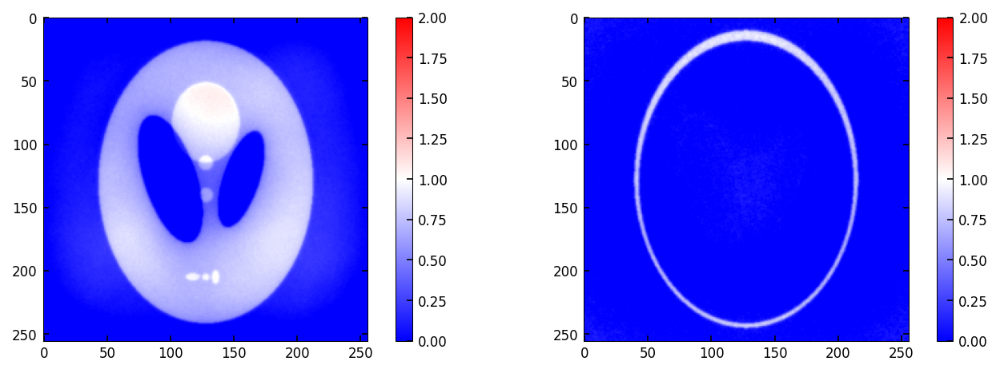

0/50 mm --- 26 keV --- SSIM = 0.640/0.875 --- RMSE = 0.105/0.066


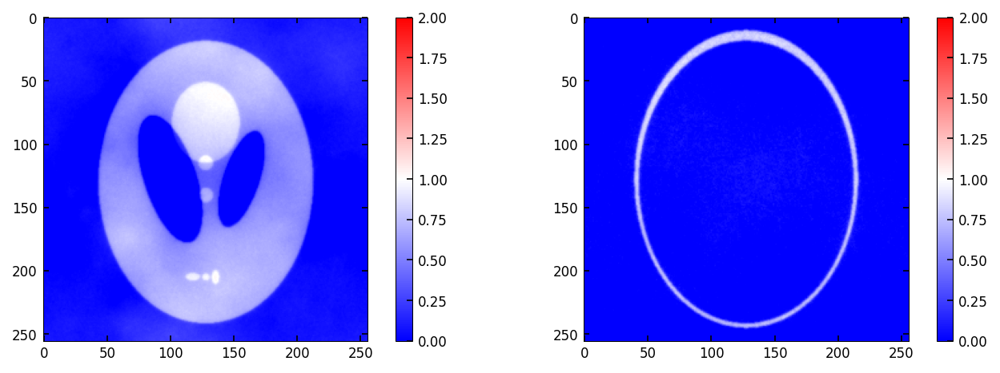

0/110 mm --- 26 keV --- SSIM = 0.760/0.853 --- RMSE = 0.103/0.072


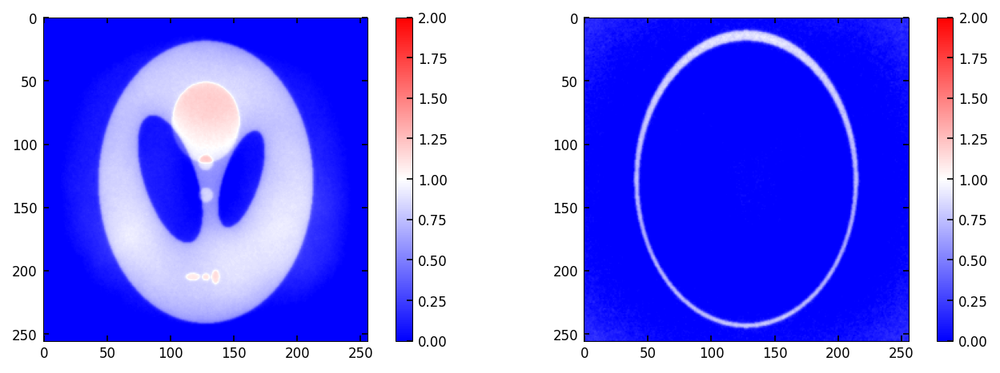

0/20 mm --- 22 keV --- SSIM = 0.907/0.635 --- RMSE = 0.114/0.072


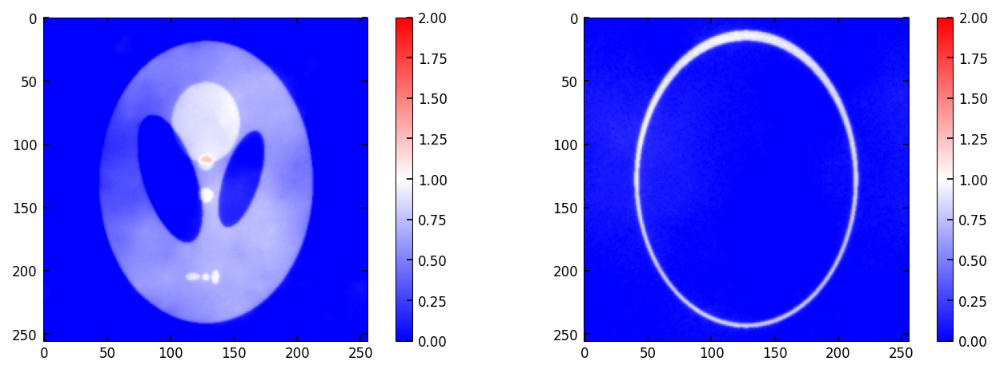

0/30 mm --- 22 keV --- SSIM = 0.861/0.587 --- RMSE = 0.137/0.071


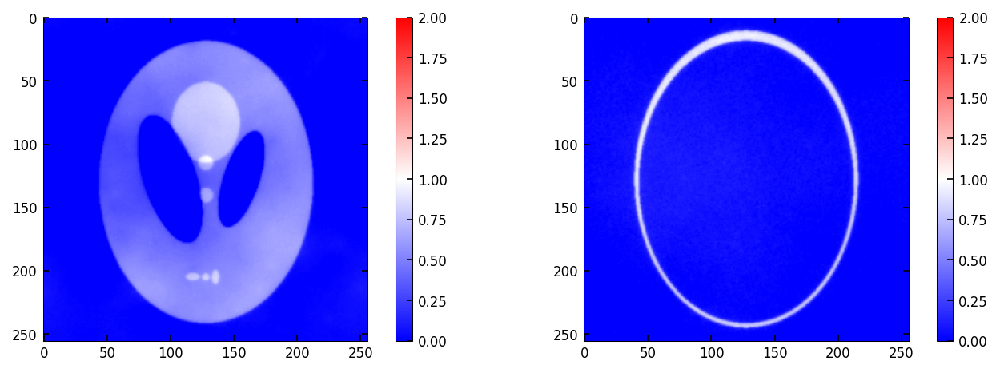

CPU times: user 906 ms, sys: 65.2 ms, total: 972 ms
Wall time: 1.15 s


In [312]:
%%time

# Sort the list of dictionaries by the 'age' value
# testsort1 = sorted(output_spectral, key=lambda x: x['ssim'])[::-1]
rsort1 = sorted(output_multidist, key=lambda x: x['rmse'])

for data in rsort1[:5]:
    print(f"{data['R1']}/{data['R2']} mm --- {data['E']} keV --- SSIM = {data['ssim1']:.3f}/{data['ssim2']:.3f} --- RMSE = {data['rmse1']:.3f}/{data['rmse2']:.3f}")
    fig, ax = plt.subplots(1, 2, figsize=[9,3], layout='constrained')
    m = ax[0].imshow(data['im1'], **kw)
    fig.colorbar(m, ax=ax[0])
    m = ax[1].imshow(data['im2'], **kw)
    fig.colorbar(m, ax=ax[1])
    plt.show()

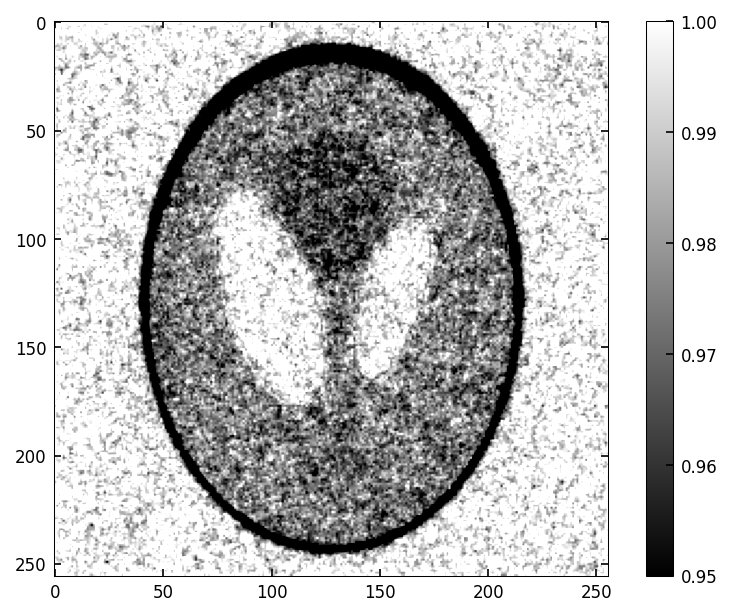

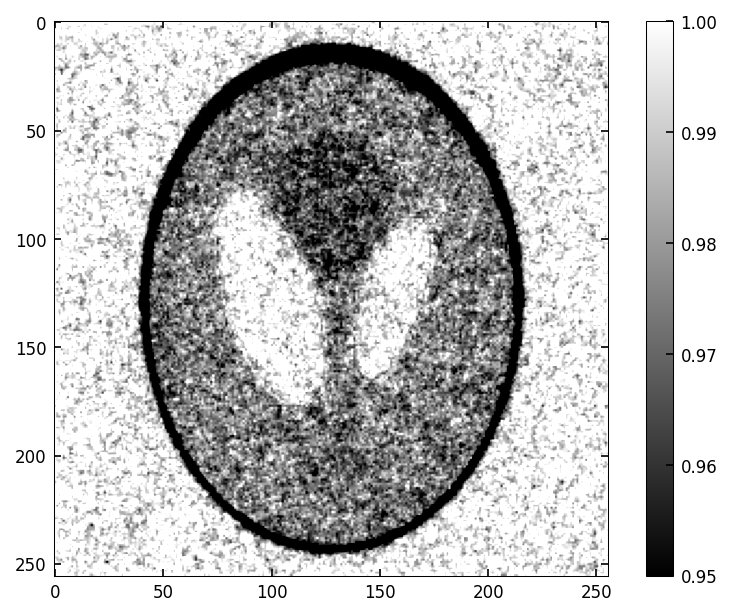

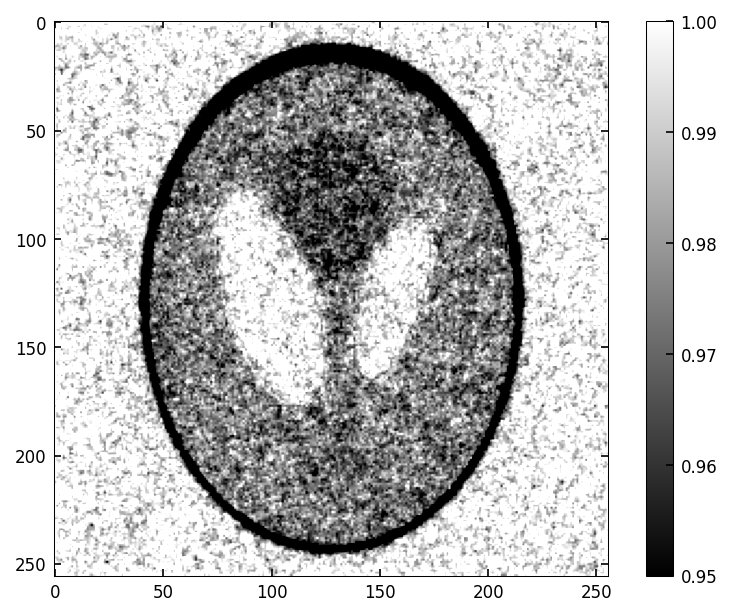

In [324]:
energy = 20
propdist = 10e-3
dproj, bproj = mats_to_dbproj(phantom, energy, mat1, mat2, T1, T2)
tests = []
for noisescale in [3,3,3]:
    test = simulate_projection(bproj, dproj, dx, N, det_shape, det_dx, det_fwhm, energy, propdist, I0=10**noisescale, det_psf=det_psf) 
    tests.append(test)
    plt.imshow(test,vmin=0.95, vmax=1)
    plt.colorbar()
    plt.show()
# fig, ax = plt.su

<unknown>:41: SyntaxWarning: invalid escape sequence '\i'
<unknown>:41: SyntaxWarning: invalid escape sequence '\i'


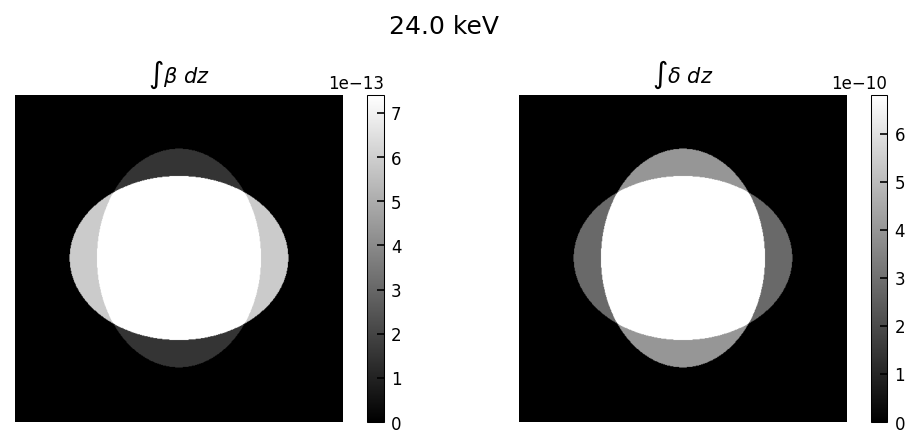

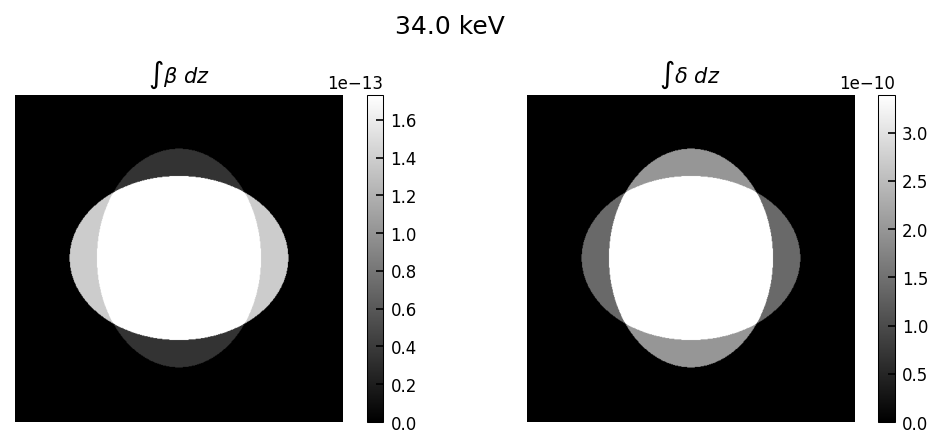

CPU times: user 444 ms, sys: 15.5 ms, total: 459 ms
Wall time: 448 ms


In [12]:
%%time

# make projections

energies = jnp.array([24.0, 34.0])  

fov = 1e-3 
phantom_Nx = 512
   
mat1, p1 = 'Al(100.0)', 2.699
mat2, p2 = 'H(11.2)O(88.8)', 1.0
mat1_dn, mat1_beta = get_delta_beta_mix(mat1, energies, p1)
mat2_dn, mat2_beta = get_delta_beta_mix(mat2, energies, p2)
mus = 2 * (2 * PI / get_wavelen(energies)) * jnp.array([mat1_beta, mat2_beta])
ds = jnp.array([mat1_dn, mat2_dn])

t1 = 0.3e-3   #0.1 * fov 
t2 = 1.1e-3   #0.9 * fov   

phantom_shape = [phantom_Nx, phantom_Nx]  # assume isotropic
phantom_px = fov / phantom_shape[0]

# ### WEAK EDGE PHANTOM
# tmap1 = jnp.sum(jnp.load('vol1_512.npy'), axis=0)
# tmap2 = jnp.sum(jnp.load('vol2_512.npy'), axis=0)
# tmap1 *= t1 / jnp.max(tmap1)
# tmap2 *= t2 / jnp.max(tmap2)

## STRONG EDGE PHANTOM
tmap1, tmap2 = jnp.zeros([2, phantom_shape[0], phantom_shape[1]])
x = jnp.arange(-fov/2, fov/2, phantom_px) + phantom_px/2
X, Y = jnp.meshgrid(x, x)
tmap1 = tmap1.at[(3*X/fov)**2 + (4*Y/fov)**2 <= 1].set(t1)
tmap2 = tmap2.at[(4*X/fov)**2 + (3*Y/fov)**2 <= 1].set(t2)

for e, E in enumerate(energies):
    
    beta_proj = mat1_beta[e]*tmap1 + mat2_beta[e]*tmap2
    dn_proj = mat1_dn[e]*tmap1 + mat2_dn[e]*tmap2
    
    fig, ax = plt.subplots(1, 2, figsize=[7,3])
    fig.suptitle(f'{E} keV')
    for i, stuff in enumerate(zip([beta_proj, dn_proj],['$\int \\beta ~dz$', '$\int \\delta ~dz$'])):
        im, ttl = stuff
        m = ax[i].imshow(im)
        fig.colorbar(m, ax=ax[i])
        ax[i].axis('off')
        ax[i].set_title(ttl)
    fig.tight_layout()
    plt.show()